In [0]:
# Importing necessary libraries for handling the data with PySpark
from pyspark.sql import SparkSession
from pyspark.sql.functions import *
import matplotlib.pyplot as plt
import pandas as pd

# Setting up the Spark session
spark = SparkSession.builder\
                    .appName("TopicsAnalysis")\
                    .getOrCreate()

In [0]:
#Data Cleaning and Preprocessing

health_data_raw = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/svegesa@gmu.edu/Alzheimer_s_Disease_and_Healthy_Aging_Data_20240427-1.csv")

df_cleaned = health_data_raw.drop("Data_Value_Alt", "Data_Value_Footnote_Symbol", "Data_Value_Footnote")

# Show the resulting DataFrame
df_cleaned.show()
display(df_cleaned)

from pyspark.sql import SparkSession
from pyspark.sql import functions as F

# Replacing null values with 'NULL' in specified columns
df_filled = df_cleaned.fillna("NULL", subset=["StratificationCategory2", "Stratification2", "Geolocation"])

# Replacing blank values with 'NULL'
df_replaced = df_filled.withColumn("StratificationCategory2", 
                                   F.when(F.col("StratificationCategory2") == "", "NULL").otherwise(F.col("StratificationCategory2"))) \
                       .withColumn("Stratification2", 
                                   F.when(F.col("Stratification2") == "", "NULL").otherwise(F.col("Stratification2"))) \
                       .withColumn("Geolocation", 
                                   F.when(F.col("Geolocation") == "", "NULL").otherwise(F.col("Geolocation")))
                       
filtered_data = health_data.filter(health_data['Data_Value'].isNotNull() & (health_data['Data_Value'] != ""))
                       
health_data = filtered_data[filtered_data['Data_Value_Type'] == 'Percentage']

# Show the resulting DataFrame
display(health_data)


+--------------------+---------+-------+------------+-------------+----------+--------------------+--------------------+--------------------+---------------+---------------+---------------+----------+--------------------+---------------------+-----------------------+-----------------+-----------------------+-------------------+--------------------+-------+-------+----------+----------+-------------------------+-----------------+-------------------------+-----------------+
|               RowId|YearStart|YearEnd|LocationAbbr| LocationDesc|Datasource|               Class|               Topic|            Question|Data_Value_Unit|DataValueTypeID|Data_Value_Type|Data_Value|Low_Confidence_Limit|High_Confidence_Limit|StratificationCategory1|  Stratification1|StratificationCategory2|    Stratification2|         Geolocation|ClassID|TopicID|QuestionID|LocationID|StratificationCategoryID1|StratificationID1|StratificationCategoryID2|StratificationID2|
+--------------------+---------+-------+------

RowId,YearStart,YearEnd,LocationAbbr,LocationDesc,Datasource,Class,Topic,Question,Data_Value_Unit,DataValueTypeID,Data_Value_Type,Data_Value,Low_Confidence_Limit,High_Confidence_Limit,StratificationCategory1,Stratification1,StratificationCategory2,Stratification2,Geolocation,ClassID,TopicID,QuestionID,LocationID,StratificationCategoryID1,StratificationID1,StratificationCategoryID2,StratificationID2
BRFSS~2015~2015~9004~Q43~TOC11~AGE~OVERALL,2015,2015,WEST,West,BRFSS,Overall Health,Arthritis among older adults,Percentage of older adults ever told they have arthritis,%,PRCTG,Percentage,48.4,47.0,49.7,Age Group,65 years or older,null,null,null,C01,TOC11,Q43,9004,AGE,65PLUS,OVERALL,OVERALL
BRFSS~2019~2019~9004~Q27~TMC03~AGE~OVERALL,2019,2019,WEST,West,BRFSS,Mental Health,Lifetime diagnosis of depression,Percentage of older adults with a lifetime diagnosis of depression,%,PRCTG,Percentage,16.7,16.1,17.3,Age Group,Overall,null,null,null,C05,TMC03,Q27,9004,AGE,AGE_OVERALL,OVERALL,OVERALL
BRFSS~2019~2019~9004~Q43~TOC11~AGE~GENDER,2019,2019,WEST,West,BRFSS,Overall Health,Arthritis among older adults,Percentage of older adults ever told they have arthritis,%,PRCTG,Percentage,54.9,53.1,56.7,Age Group,65 years or older,Gender,Female,null,C01,TOC11,Q43,9004,AGE,65PLUS,GENDER,FEMALE
BRFSS~2019~2019~9004~Q43~TOC11~AGE~OVERALL,2019,2019,WEST,West,BRFSS,Overall Health,Arthritis among older adults,Percentage of older adults ever told they have arthritis,%,PRCTG,Percentage,38.6,37.7,39.5,Age Group,Overall,null,null,null,C01,TOC11,Q43,9004,AGE,AGE_OVERALL,OVERALL,OVERALL
BRFSS~2015~2015~9004~Q43~TOC11~AGE~GENDER,2015,2015,WEST,West,BRFSS,Overall Health,Arthritis among older adults,Percentage of older adults ever told they have arthritis,%,PRCTG,Percentage,32.6,31.4,33.9,Age Group,Overall,Gender,Male,null,C01,TOC11,Q43,9004,AGE,AGE_OVERALL,GENDER,MALE
BRFSS~2015~2015~9004~Q43~TOC11~AGE~RACE,2015,2015,WEST,West,BRFSS,Overall Health,Arthritis among older adults,Percentage of older adults ever told they have arthritis,%,PRCTG,Percentage,40.7,39.8,41.6,Age Group,Overall,Race/Ethnicity,"White, non-Hispanic",null,C01,TOC11,Q43,9004,AGE,AGE_OVERALL,RACE,WHT
BRFSS~2017~2017~9004~Q43~TOC11~AGE~RACE,2017,2017,WEST,West,BRFSS,Overall Health,Arthritis among older adults,Percentage of older adults ever told they have arthritis,%,PRCTG,Percentage,53.6,41.8,65.0,Age Group,65 years or older,Race/Ethnicity,"Black, non-Hispanic",null,C01,TOC11,Q43,9004,AGE,65PLUS,RACE,BLK
BRFSS~2019~2019~9004~Q27~TMC03~AGE~RACE,2019,2019,WEST,West,BRFSS,Mental Health,Lifetime diagnosis of depression,Percentage of older adults with a lifetime diagnosis of depression,%,PRCTG,Percentage,15.2,13.4,17.3,Age Group,50-64 years,Race/Ethnicity,Hispanic,null,C05,TMC03,Q27,9004,AGE,5064,RACE,HIS
BRFSS~2019~2019~50~Q27~TMC03~AGE~OVERALL,2019,2019,VT,Vermont,BRFSS,Mental Health,Lifetime diagnosis of depression,Percentage of older adults with a lifetime diagnosis of depression,%,PRCTG,Percentage,19.1,17.6,20.7,Age Group,Overall,null,null,POINT(-72.51764079099962 43.62538123900049),C05,TMC03,Q27,50,AGE,AGE_OVERALL,OVERALL,OVERALL
BRFSS~2020~2020~41~Q03~TMC01~AGE~RACE,2020,2020,OR,Oregon,BRFSS,Mental Health,Frequent mental distress,Percentage of older adults who are experiencing frequent mental distress,%,PRCTG,Percentage,17.6,11.0,27.0,Age Group,Overall,Race/Ethnicity,Hispanic,POINT(-120.15503132599969 44.56744942400047),C05,TMC01,Q03,41,AGE,AGE_OVERALL,RACE,HIS


RowId,YearStart,YearEnd,LocationAbbr,LocationDesc,Datasource,Class,Topic,Question,Data_Value_Unit,DataValueTypeID,Data_Value_Type,Data_Value,Low_Confidence_Limit,High_Confidence_Limit,StratificationCategory1,Stratification1,StratificationCategory2,Stratification2,Geolocation,ClassID,TopicID,QuestionID,LocationID,StratificationCategoryID1,StratificationID1,StratificationCategoryID2,StratificationID2
BRFSS~2015~2015~9004~Q43~TOC11~AGE~OVERALL,2015,2015,WEST,West,BRFSS,Overall Health,Arthritis among older adults,Percentage of older adults ever told they have arthritis,%,PRCTG,Percentage,48.4,47.0,49.7,Age Group,65 years or older,NULL,NULL,NULL,C01,TOC11,Q43,9004,AGE,65PLUS,OVERALL,OVERALL
BRFSS~2019~2019~9004~Q27~TMC03~AGE~OVERALL,2019,2019,WEST,West,BRFSS,Mental Health,Lifetime diagnosis of depression,Percentage of older adults with a lifetime diagnosis of depression,%,PRCTG,Percentage,16.7,16.1,17.3,Age Group,Overall,NULL,NULL,NULL,C05,TMC03,Q27,9004,AGE,AGE_OVERALL,OVERALL,OVERALL
BRFSS~2019~2019~9004~Q43~TOC11~AGE~GENDER,2019,2019,WEST,West,BRFSS,Overall Health,Arthritis among older adults,Percentage of older adults ever told they have arthritis,%,PRCTG,Percentage,54.9,53.1,56.7,Age Group,65 years or older,Gender,Female,NULL,C01,TOC11,Q43,9004,AGE,65PLUS,GENDER,FEMALE
BRFSS~2019~2019~9004~Q43~TOC11~AGE~OVERALL,2019,2019,WEST,West,BRFSS,Overall Health,Arthritis among older adults,Percentage of older adults ever told they have arthritis,%,PRCTG,Percentage,38.6,37.7,39.5,Age Group,Overall,NULL,NULL,NULL,C01,TOC11,Q43,9004,AGE,AGE_OVERALL,OVERALL,OVERALL
BRFSS~2015~2015~9004~Q43~TOC11~AGE~GENDER,2015,2015,WEST,West,BRFSS,Overall Health,Arthritis among older adults,Percentage of older adults ever told they have arthritis,%,PRCTG,Percentage,32.6,31.4,33.9,Age Group,Overall,Gender,Male,NULL,C01,TOC11,Q43,9004,AGE,AGE_OVERALL,GENDER,MALE
BRFSS~2015~2015~9004~Q43~TOC11~AGE~RACE,2015,2015,WEST,West,BRFSS,Overall Health,Arthritis among older adults,Percentage of older adults ever told they have arthritis,%,PRCTG,Percentage,40.7,39.8,41.6,Age Group,Overall,Race/Ethnicity,"White, non-Hispanic",NULL,C01,TOC11,Q43,9004,AGE,AGE_OVERALL,RACE,WHT
BRFSS~2017~2017~9004~Q43~TOC11~AGE~RACE,2017,2017,WEST,West,BRFSS,Overall Health,Arthritis among older adults,Percentage of older adults ever told they have arthritis,%,PRCTG,Percentage,53.6,41.8,65.0,Age Group,65 years or older,Race/Ethnicity,"Black, non-Hispanic",NULL,C01,TOC11,Q43,9004,AGE,65PLUS,RACE,BLK
BRFSS~2019~2019~9004~Q27~TMC03~AGE~RACE,2019,2019,WEST,West,BRFSS,Mental Health,Lifetime diagnosis of depression,Percentage of older adults with a lifetime diagnosis of depression,%,PRCTG,Percentage,15.2,13.4,17.3,Age Group,50-64 years,Race/Ethnicity,Hispanic,NULL,C05,TMC03,Q27,9004,AGE,5064,RACE,HIS
BRFSS~2019~2019~50~Q27~TMC03~AGE~OVERALL,2019,2019,VT,Vermont,BRFSS,Mental Health,Lifetime diagnosis of depression,Percentage of older adults with a lifetime diagnosis of depression,%,PRCTG,Percentage,19.1,17.6,20.7,Age Group,Overall,NULL,NULL,POINT(-72.51764079099962 43.62538123900049),C05,TMC03,Q27,50,AGE,AGE_OVERALL,OVERALL,OVERALL
BRFSS~2020~2020~41~Q03~TMC01~AGE~RACE,2020,2020,OR,Oregon,BRFSS,Mental Health,Frequent mental distress,Percentage of older adults who are experiencing frequent mental distress,%,PRCTG,Percentage,17.6,11.0,27.0,Age Group,Overall,Race/Ethnicity,Hispanic,POINT(-120.15503132599969 44.56744942400047),C05,TMC01,Q03,41,AGE,AGE_OVERALL,RACE,HIS


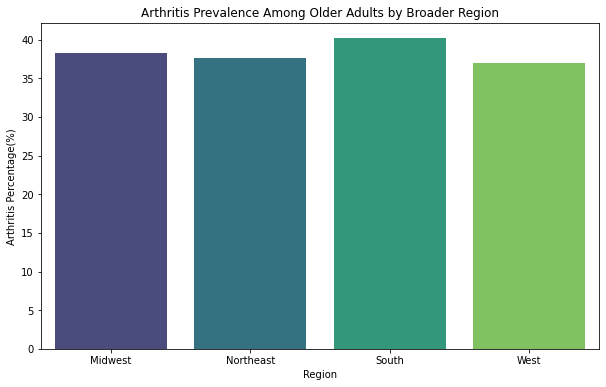

In [0]:
#What is the prevalence of arthritis among older adults across different regions in 2020-2021?

# Dictionary to map states to broader regions
state_to_region = {
    "CT": "Northeast", "ME": "Northeast", "MA": "Northeast", "NH": "Northeast", "RI": "Northeast", "VT": "Northeast",
    "NJ": "Northeast", "NY": "Northeast", "PA": "Northeast",
    "IL": "Midwest", "IN": "Midwest", "MI": "Midwest", "OH": "Midwest", "WI": "Midwest", "IA": "Midwest", "KS": "Midwest",
    "MN": "Midwest", "MO": "Midwest", "NE": "Midwest", "ND": "Midwest", "SD": "Midwest",
    "DE": "South", "FL": "South", "GA": "South", "MD": "South", "NC": "South", "SC": "South", "VA": "South", "WV": "South",
    "AL": "South", "KY": "South", "MS": "South", "TN": "South", "AR": "South", "LA": "South", "TX": "South", "OK": "South",
    "AZ": "West", "CO": "West", "ID": "West", "MT": "West", "NV": "West", "NM": "West", "UT": "West", "WY": "West",
    "AK": "West", "CA": "West", "HI": "West", "OR": "West", "WA": "West"
}

import pandas as pd
from pyspark.sql import SparkSession

#Create a Spark session
spark = SparkSession.builder \
    .appName("Arthritis Analysis") \
    .getOrCreate()

# Select the relevant columns and convert to Pandas DataFrame
arthritis_data = health_data.select("LocationAbbr", "LocationDesc", "Data_Value").toPandas()

# Add a new column for broader region using the state-to-region mapping
arthritis_data["Region"] = arthritis_data["LocationAbbr"].map(state_to_region)

# Ensure 'Data_Value' is numeric and remove rows with missing values
arthritis_data["Data_Value"] = pd.to_numeric(arthritis_data["Data_Value"], errors="coerce")
arthritis_data.dropna(subset=["Data_Value", "Region"], inplace=True)

import seaborn as sns
import matplotlib.pyplot as plt

# Group data by region and calculate the mean arthritis percentage
arthritis_by_region = arthritis_data.groupby("Region")["Data_Value"].mean().reset_index()

# Create the bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x="Region", y="Data_Value", data=arthritis_by_region, palette="viridis")

plt.title("Arthritis Prevalence Among Older Adults by Broader Region")
plt.xlabel("Region")
plt.ylabel("Arthritis Percentage(%)")
plt.show()


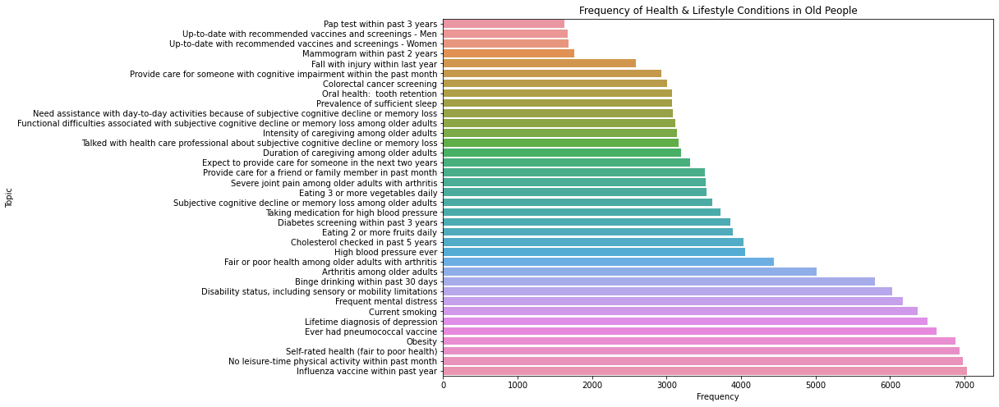

In [0]:
#What is the frequency of different health and lifestyle conditions related to Older people?

from pyspark.sql import SparkSession
from pyspark.sql.functions import col, udf
from pyspark.sql.types import StringType
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create a Spark session
spark = SparkSession.builder.appName("Disease Frequency by Region").getOrCreate()

# Select the relevant columns and convert to Pandas DataFrame
data = health_data.select("Topic").toPandas()

# Group by Region and Disease, then count the frequency
grouped_data_pd = data.groupby(["Topic"]).size().reset_index(name="Frequency")
plt.figure(figsize=(12, 8))
grouped_data_pd = grouped_data_pd.sort_values(by="Frequency", ascending=True)

# Create a histogram to visualize the frequency of diseases by region
sns.barplot(data=grouped_data_pd, x="Frequency", y="Topic")

plt.title("Frequency of Health & Lifestyle Conditions in Old People")
plt.xlabel("Frequency")
plt.ylabel("Topic")
plt.show()


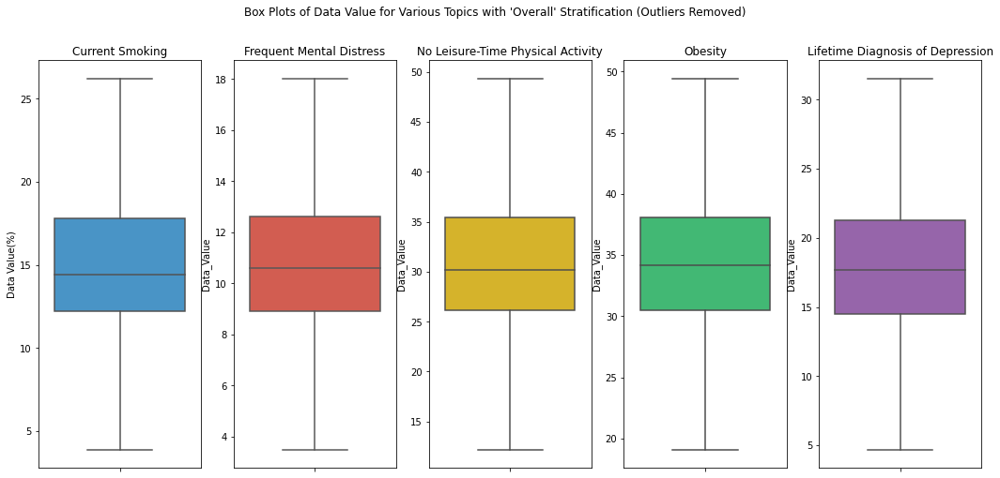

In [0]:
#How do the distributions of data for different Health and Lifestyle conditions among older people compare with each other?

import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Create a custom color palette for the box plots
colors = ["#3498db", "#e74c3c", "#f1c40f", "#2ecc71", "#9b59b6"]

data = health_data.select("Topic", "Stratification1", "Data_Value").toPandas()

data["Data_Value"] = pd.to_numeric(data["Data_Value"], errors="coerce")
data.dropna(subset=["Data_Value"], inplace=True)

# Filter the data for each specific topic with 'Overall' stratification
smoking_data = data[(data["Topic"] == "Current smoking") & (data["Stratification1"] == "Overall")]
mental_distress_data = data[(data["Topic"] == "Frequent mental distress") & (data["Stratification1"] == "Overall")]
physical_activity_data = data[(data["Topic"] == "No leisure-time physical activity within past month") & (data["Stratification1"] == "Overall")]
obesity_data = data[(data["Topic"] == "Obesity") & (data["Stratification1"] == "Overall")]
depression_data = data[(data["Topic"] == "Lifetime diagnosis of depression") & (data["Stratification1"] == "Overall")]

# Create a grid of box plots with 1 row and 5 columns
fig, axes = plt.subplots(1, 5, figsize=(18, 8))

# Generate box plots for each dataset with different colors
sns.boxplot(data=smoking_data, y="Data_Value", ax=axes[0], whis=1.5, showfliers=False, color=colors[0])
axes[0].set_title("Current Smoking")
axes[0].set_ylabel("Data Value(%)")

sns.boxplot(data=mental_distress_data, y="Data_Value", ax=axes[1], whis=1.5, showfliers=False, color=colors[1])
axes[1].set_title("Frequent Mental Distress")

sns.boxplot(data=physical_activity_data, y="Data_Value", ax=axes[2], whis=1.5, showfliers=False, color=colors[2])
axes[2].set_title("No Leisure-Time Physical Activity")

sns.boxplot(data=obesity_data, y="Data_Value", ax=axes[3], whis=1.5, showfliers=False, color=colors[3])
axes[3].set_title("Obesity")

sns.boxplot(data=depression_data, y="Data_Value", ax=axes[4], whis=1.5, showfliers=False, color=colors[4])
axes[4].set_title("Lifetime Diagnosis of Depression")

# Set common title and show the plot
fig.suptitle("Box Plots of Data Value for Various Topics with 'Overall' Stratification (Outliers Removed)")
plt.show()


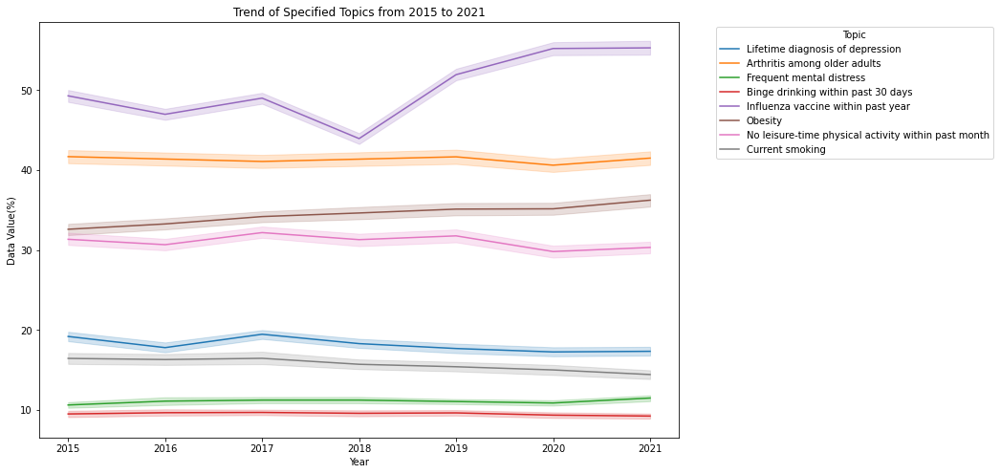

In [0]:
#How have the different health-related topics changed over time from 2015 to 2021? Are there noticeable increases, decreases, or stable trends for each topic?

df = health_data.withColumn("YearStart", col("YearStart").cast("int"))

# Select relevant columns and convert to Pandas DataFrame
data = df.select("YearStart", "Topic", "Data_Value", "Stratification1").toPandas()

# Ensure 'Data_Value' is numeric for plotting
data["Data_Value"] = pd.to_numeric(data["Data_Value"], errors="coerce")

# Filter the data for the specific topics
topics = [
    "Current smoking", 
    "Frequent mental distress", 
    "No leisure-time physical activity within past month",  
    "Obesity", 
    "Lifetime diagnosis of depression",
    "Influenza vaccine within past year",
    "Binge drinking within past 30 days",
    "Arthritis among older adults"
]

filtered_data = data[(data["Topic"].isin(topics)) & (data["Stratification1"] == "Overall")]

# Create a line plot to show trends from 2015 to 2021 for the specified topics
plt.figure(figsize=(12, 8))
sns.lineplot(x="YearStart", y="Data_Value", hue="Topic", data=filtered_data)

plt.title("Trend of Specified Topics from 2015 to 2021")
plt.xlabel("Year")
plt.ylabel("Data Value(%)")
plt.legend(title="Topic", bbox_to_anchor=(1.05, 1), loc="upper left")

plt.show()

In [0]:
#CREATING A LINEAR REGRESSION MODEL: 

In [0]:

# Convert Data_Value to a numeric type
df = health_data.withColumn("Data_Value", col("Data_Value").cast("double"))

df = df.fillna({"Data_Value": 0})

In [0]:
topic_types = ['Frequent mental distress', 'Current smoking']
health_data_for_topic_types = df[df.Topic.isin(topic_types)]

In [0]:
# Choosing the relevant columns
relevant_columns = [
    "YearStart", "YearEnd", "LocationAbbr", "Class", "Topic", "Question", "Data_Value_Unit", "Data_Value", "Low_Confidence_Limit", "High_Confidence_Limit", "StratificationCategory1", "Stratification1", "StratificationCategory2", "Stratification2", "StratificationCategoryID1", "StratificationID1", "StratificationCategoryID2"]

health_data_for_topic_types = health_data_for_topic_types.select(*relevant_columns)

In [0]:
from pyspark.sql.functions import udf
from pyspark.sql.types import FloatType

# Dropping records with null values
health_data_for_topic_types = health_data_for_topic_types.dropna(subset=["Topic", "Class","Question","Data_Value_Unit","Data_Value", "Stratification1"])


In [0]:
# Splitting the data into training and testing sets
train_df, test_df = health_data_for_topic_types.randomSplit([0.8, 0.2], seed=123)
print(train_df.cache().count()) 
print(test_df.count())

10069
2466


In [0]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder
categorical_cols = ["Class", "Topic"]
 
from pyspark.ml.feature import VectorAssembler

string_indexer = StringIndexer(
    inputCols=categorical_cols, 
    outputCols=[f"{c}_index" for c in categorical_cols], 
    handleInvalid="keep"  # Keeps invalid data by assigning default index
)

#OneHotEncoder for indexed columns
one_hot_encoder = OneHotEncoder(
    inputCols=string_indexer.getOutputCols(),
    outputCols=[f"{c}_ohe" for c in categorical_cols]
)

#VectorAssembler to create feature vectors for linear regression
assembler = VectorAssembler(
    inputCols=[f"{c}_ohe" for c in categorical_cols] + ["Data_Value"],
    outputCol="features"
)



In [0]:
from pyspark.ml.regression import LinearRegression
# Create a Linear Regression model
lr = LinearRegression(featuresCol="features", labelCol="Data_Value")


In [0]:

from pyspark.ml import Pipeline
#Pipeline with the stages: StringIndexer, OneHotEncoder, VectorAssembler, Linear Regression
pipeline = Pipeline(stages=[string_indexer, one_hot_encoder, assembler, lr])

# Fit the pipeline on the training data
pipeline_model = pipeline.fit(train_df)

# Make predictions on the test data
predictions = pipeline_model.transform(test_df)

# Display predictions and model accuracy
predictions.select("features", "Data_Value", "prediction").show(10)

+--------------------+----------+------------------+
|            features|Data_Value|        prediction|
+--------------------+----------+------------------+
|[0.0,1.0,0.0,1.0,...|       7.3| 7.300000000000001|
|[0.0,1.0,0.0,1.0,...|       4.2| 4.200000000000002|
|[0.0,1.0,0.0,1.0,...|       7.5| 7.500000000000001|
|[0.0,1.0,0.0,1.0,...|       7.5| 7.500000000000001|
|[0.0,1.0,0.0,1.0,...|       9.5|               9.5|
|[0.0,1.0,0.0,1.0,...|      15.7|15.699999999999998|
|[1.0,0.0,1.0,0.0,...|      13.9|13.900000000000002|
|[0.0,1.0,0.0,1.0,...|       8.7|               8.7|
|[0.0,1.0,0.0,1.0,...|      15.3|15.299999999999999|
|[1.0,0.0,1.0,0.0,...|      14.4|14.400000000000002|
+--------------------+----------+------------------+
only showing top 10 rows



In [0]:
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.regression import LinearRegression
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml import Pipeline

# Define a parameter grid for tuning
param_grid = (
    ParamGridBuilder()
    .addGrid(lr.regParam, [0.1, 0.01, 0.001]) 
    .addGrid(lr.elasticNetParam, [0.0, 0.5, 1.0])  
    .build()
)

# Create a RegressionEvaluator for evaluation
regression_evaluator = RegressionEvaluator(
    labelCol="Data_Value",
    predictionCol="prediction",
    metricName="rmse"  # Using RMSE (Root Mean Squared Error) to evaluate the model
)

# Create a 3-fold CrossValidator
cross_validator = CrossValidator(
    estimator=pipeline,  
    estimatorParamMaps=param_grid,  
    evaluator=regression_evaluator, 
    numFolds=3,  
    parallelism=2  
)

# Perform cross-validation and fit the model
cv_model = cross_validator.fit(train_df)

# Apply the best model from cross-validation to the test dataset
cv_predictions = cv_model.transform(test_df)

# Evaluate model performance with RMSE
rmse = regression_evaluator.evaluate(cv_predictions)
print(f"Root Mean Squared Error after cross-validation: {rmse:.2f}")

# Additional evaluation metrics
mae_evaluator = RegressionEvaluator(
    labelCol="Data_Value",
    predictionCol="prediction",
    metricName="mae"  # Mean Absolute Error
)

mae = mae_evaluator.evaluate(cv_predictions)
print(f"Mean Absolute Error after cross-validation: {mae:.2f}")

r2_evaluator = RegressionEvaluator(
    labelCol="Data_Value",
    predictionCol="prediction",
    metricName="r2"  # R-squared, indicating the proportion of variance explained
)

r2 = r2_evaluator.evaluate(cv_predictions)
print(f"R-squared after cross-validation: {r2:.2f}")

# Displaying the first 10 predictions with actual and predicted values
cv_predictions.select("features", "Data_Value", "prediction").show(10)


Root Mean Squared Error after cross-validation: 0.00
Mean Absolute Error after cross-validation: 0.00
R-squared after cross-validation: 1.00
+--------------------+----------+------------------+
|            features|Data_Value|        prediction|
+--------------------+----------+------------------+
|[0.0,1.0,0.0,1.0,...|       7.3| 7.300956935833983|
|[0.0,1.0,0.0,1.0,...|       4.2| 4.201473695653787|
|[0.0,1.0,0.0,1.0,...|       7.5|  7.50092359649077|
|[0.0,1.0,0.0,1.0,...|       7.5|  7.50092359649077|
|[0.0,1.0,0.0,1.0,...|       9.5| 9.500590203058637|
|[0.0,1.0,0.0,1.0,...|      15.7| 15.69955668341903|
|[1.0,0.0,1.0,0.0,...|      13.9| 13.89985673750795|
|[0.0,1.0,0.0,1.0,...|       8.7|  8.70072356043149|
|[0.0,1.0,0.0,1.0,...|      15.3|15.299623362105457|
|[1.0,0.0,1.0,0.0,...|      14.4|14.399773389149916|
+--------------------+----------+------------------+
only showing top 10 rows



In [0]:
#Gradient Boosted Tree Regressor: 

In [0]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml.regression import GBTRegressor
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import RegressionEvaluator

spark = SparkSession.builder.appName("GBT Regression Example").getOrCreate()

# Filling missing values in `Data_Value`
df = df.fillna({"Data_Value": 0})


In [0]:
# Categorical columns to index and encode
categorical_cols = ["LocationAbbr", "Class", "Topic", "Stratification1"]

# Create StringIndexer and OneHotEncoder
string_indexer = StringIndexer(
    inputCols=categorical_cols,
    outputCols=[f"{c}_index" for c in categorical_cols],
    handleInvalid="keep" 
)

one_hot_encoder = OneHotEncoder(
    inputCols=string_indexer.getOutputCols(),
    outputCols=[f"{c}_ohe" for c in categorical_cols]
)

# VectorAssembler to create feature vectors
assembler = VectorAssembler(
    inputCols=[f"{c}_ohe" for c in categorical_cols], 
    outputCol="features"
)


In [0]:

# Gradient Boosted Trees for regression
gbt = GBTRegressor(featuresCol="features", labelCol="Data_Value", maxIter=10)


In [0]:
# Pipeline to combine transformations and GBT model
pipeline = Pipeline(stages=[string_indexer, one_hot_encoder, assembler, gbt])

# Split the data into training and testing sets
train_df, test_df = df.randomSplit([0.8, 0.2], seed=42)

# Fit the pipeline on the training data
pipeline_model = pipeline.fit(train_df)

# Predict on the test data
predictions = pipeline_model.transform(test_df)

# Display predictions
predictions.select("features", "Data_Value", "prediction").show(10)


+--------------------+----------+------------------+
|            features|Data_Value|        prediction|
+--------------------+----------+------------------+
|(105,[10,64,73,10...|       9.6|14.801695680520776|
|(105,[41,63,83,10...|      15.3| 18.07119671092885|
|(105,[28,59,67,10...|      19.4|26.513979511897446|
|(105,[28,59,77,10...|      55.9| 29.34849687351383|
|(105,[24,59,85,10...|      34.8| 27.59644447497766|
|(105,[13,59,76,10...|      52.7| 40.26347696199818|
|(105,[48,60,79,10...|      90.0| 94.20914430418632|
|(105,[33,64,73,10...|       8.6|14.801695680520776|
|(105,[52,61,80,10...|      32.0| 29.01807055393397|
|(105,[52,64,73,10...|       5.5|15.763577748557106|
+--------------------+----------+------------------+
only showing top 10 rows



In [0]:

# Evaluate the model's performance
regression_evaluator = RegressionEvaluator(
    labelCol="Data_Value",
    predictionCol="prediction",
    metricName="rmse"
)

rmse = regression_evaluator.evaluate(predictions)
print(f"Root Mean Squared Error for GBT: {rmse:.2f}")

# Additional evaluation metrics
mae_evaluator = RegressionEvaluator(labelCol="Data_Value", predictionCol="prediction", metricName="mae")
mae = mae_evaluator.evaluate(predictions)
print(f"Mean Absolute Error for GBT: {mae:.2f}")

r2_evaluator = RegressionEvaluator(labelCol="Data_Value", predictionCol="prediction", metricName="r2")
r2 = r2_evaluator.evaluate(predictions)
print(f"R-squared for GBT: {r2:.2f}")


Root Mean Squared Error for GBT: 9.30
Mean Absolute Error for GBT: 7.03
R-squared for GBT: 0.85
